In [90]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import numpy as np
import pandas as pd
from scipy.io import loadmat

import ot

In [2]:
PATH = "../data/w300/lfpw/trainset/"

In [250]:
def load_ptc(file):
    return pd.read_csv(PATH + file.replace("png", "pts"), skiprows=3, skipfooter=1, delimiter=" ", header=None, engine="python").to_numpy()[:,:2]


In [251]:
# load bounding boxes
boxes = loadmat(PATH + "bounding_boxes_lfpw_trainset.mat")["bounding_boxes"][0]
n = boxes.shape[0]
n

811

In [252]:
L = np.zeros((n, 68, 2))

for i in range(n):
    file = boxes[i][0][0][0][0]
    box = boxes[i][0][0][2][0]
    
    print(file)
    
    left_top = np.array([box[0], box[1]])
    L[i] = load_ptc(file) - left_top

image_0001.png
image_0002.png
image_0003.png
image_0004.png
image_0005.png
image_0006.png
image_0007.png
image_0008.png
image_0009.png
image_0010.png
image_0011.png
image_0012.png
image_0013.png
image_0014.png
image_0015.png
image_0016.png
image_0017.png
image_0018.png
image_0019.png
image_0020.png
image_0025.png
image_0026.png
image_0027.png
image_0028.png
image_0029.png
image_0030.png
image_0032.png
image_0033.png
image_0034.png
image_0035.png
image_0036.png
image_0037.png
image_0038.png
image_0039.png
image_0040.png
image_0041.png
image_0042.png
image_0043.png
image_0044.png
image_0045.png
image_0046.png
image_0047.png
image_0048.png
image_0049.png
image_0050.png
image_0051.png
image_0052.png
image_0053.png
image_0055.png
image_0056.png
image_0057.png
image_0058.png
image_0059.png
image_0060.png
image_0061.png
image_0062.png
image_0063.png
image_0064.png
image_0065.png
image_0066.png
image_0067.png
image_0068.png
image_0069.png
image_0070.png
image_0071.png
image_0072.png
image_0073

image_0635.png
image_0636.png
image_0637.png
image_0638.png
image_0639.png
image_0640.png
image_0641.png
image_0642.png
image_0643.png
image_0644.png
image_0645.png
image_0646.png
image_0647.png
image_0648.png
image_0649.png
image_0650.png
image_0651.png
image_0652.png
image_0653.png
image_0654.png
image_0655.png
image_0656.png
image_0657.png
image_0658.png
image_0659.png
image_0660.png
image_0662.png
image_0663.png
image_0665.png
image_0666.png
image_0667.png
image_0668.png
image_0669.png
image_0671.png
image_0672.png
image_0673.png
image_0674.png
image_0676.png
image_0677.png
image_0678.png
image_0679.png
image_0680.png
image_0681.png
image_0682.png
image_0683.png
image_0684.png
image_0685.png
image_0686.png
image_0687.png
image_0690.png
image_0691.png
image_0692.png
image_0693.png
image_0694.png
image_0695.png
image_0696.png
image_0697.png
image_0698.png
image_0699.png
image_0700.png
image_0701.png
image_0703.png
image_0704.png
image_0705.png
image_0706.png
image_0707.png
image_0708

In [266]:
max_width, max_height = np.max(L[:,:,0]), np.max(L[:,:,1])
max_width, max_height

(922.8012980000003, 949.8944250000001)

In [377]:
max_dim = max(max_width, max_height)
max_dim

949.8944250000001

In [361]:
bias = np.abs(max_height - max_width) / 2
bias

13.546563499999877

In [454]:
LS = np.zeros_like(L)

for i in range(n):
    LS[i] = scale(L[i], max_width, max_height) + np.array([bias, 0])

In [364]:
def scale(pc, max_width, max_height):
    
    # width and height of point cloud
    w, h = np.max(pc[:,0]), np.max(pc[:,1])
    
    # scale factor
    a = min(max_width / w, max_height / h)
    
    # bias
    b = np.array([(max_width - (a * w)) / 2, (max_height - (a * h)) / 2])
    
    return a * pc + b

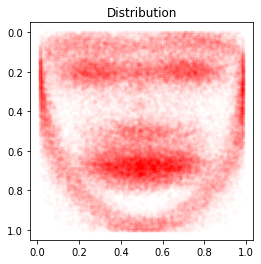

In [365]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4,4))
ax.invert_yaxis()
for i in range(n):
    
    ax.set_title("Distribution".format(i+1))
    ax.scatter(LS[i,:,0] / max_height, LS[i,:,1] / max_height, c="r", s=10, alpha=0.01)
    
    #plt.show()

In [393]:
M = np.sqrt(ot.dist(LS[0] / max_dim * 10, LS[3] / max_dim * 10))
ot.emd2(a, a, M)

0.4108046423818805

In [369]:
np.max(LS[:,:,1], axis=1)

array([893.64648066, 919.44502069, 905.35274599, 917.82271635,
       936.69855889, 904.67548954, 895.79159002, 937.93974556,
       949.894425  , 931.52307679, 908.22367517, 927.78770872,
       944.36817193, 901.48839937, 943.53236163, 912.36050676,
       941.77765173, 913.22770437, 909.75912862, 917.05515794,
       940.04635321, 924.94508803, 928.96188118, 915.46436602,
       949.68646182, 897.96204425, 911.81863855, 937.68200344,
       945.11795587, 921.67501992, 942.66253565, 926.74756973,
       920.25586066, 949.894425  , 947.45765559, 949.894425  ,
       908.6969008 , 905.0511274 , 901.60695469, 924.94379152,
       903.39678697, 911.99649884, 949.894425  , 935.68487653,
       923.66519275, 923.16712724, 893.63291377, 923.66437003,
       928.03180252, 856.70469667, 908.47654607, 908.89408886,
       940.76823968, 928.83313578, 934.91380943, 918.81111022,
       936.22002995, 829.60363545, 949.11981652, 949.894425  ,
       900.82099664, 936.30639742, 926.86861822, 949.89

TypeError: 'numpy.float64' object cannot be interpreted as an integer

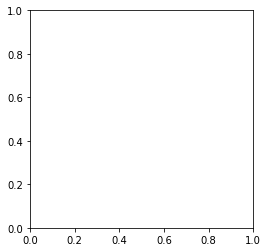

In [313]:
for i in range(n):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4,4))
    ax.set_title("Image {}, w: {:.3f}, h: {:.3f}".format(i+1, np.max(LS[i,:,0], np.max(LS[i,:,1]))))
    ax.scatter(LS[i,:,0], LS[i,:,1], c="r", s=10)
    ax.invert_yaxis()
    plt.show()

In [223]:
i = 16

In [224]:
img1path = boxes[i][0][0][0][0]
img1path

'image_0017.png'

In [237]:
box1 = boxes[i][0][0][2][0]
left, top = box1[0], box1[1]
width, height = box1[2] - box1[0], box1[3] - box1[1]
box1

array([ 65.987258, 135.6604  , 228.062664, 299.643119])

In [242]:
left_top = np.array([left, top])

In [243]:
ptc1 - left_top

array([[  0.      ,  30.405598],
       [  2.938022,  52.89533 ],
       [  7.555722,  75.670973],
       [ 13.024603,  95.473487],
       [ 21.227924, 114.8396  ],
       [ 33.774975, 133.032825],
       [ 49.45879 , 147.461934],
       [ 63.792423, 159.20434 ],
       [ 84.858278, 163.982719],
       [105.198067, 160.022386],
       [124.01102 , 146.374965],
       [137.877549, 130.743151],
       [148.996485, 110.803767],
       [156.204203,  89.69776 ],
       [160.241086,  68.463247],
       [162.075406,  46.280877],
       [161.175285,  22.700589],
       [  5.496372,  14.783694],
       [ 16.256841,   4.780132],
       [ 28.828647,   6.899798],
       [ 40.583514,  10.617761],
       [ 52.653751,  15.829723],
       [ 85.098855,  13.460576],
       [ 99.324374,   5.929357],
       [115.04339 ,   0.339401],
       [130.448667,   0.      ],
       [142.286549,   8.748857],
       [ 72.493005,  34.246989],
       [ 73.22218 ,  49.095419],
       [ 73.912681,  64.101084],
       [ 7

In [240]:
ptc1[:,0] - left

array([  0.      ,   2.938022,   7.555722,  13.024603,  21.227924,
        33.774975,  49.45879 ,  63.792423,  84.858278, 105.198067,
       124.01102 , 137.877549, 148.996485, 156.204203, 160.241086,
       162.075406, 161.175285,   5.496372,  16.256841,  28.828647,
        40.583514,  52.653751,  85.098855,  99.324374, 115.04339 ,
       130.448667, 142.286549,  72.493005,  73.22218 ,  73.912681,
        74.704317,  60.572428,  68.865997,  76.580202,  85.421202,
        93.94146 ,  23.208009,  31.676746,  42.781153,  52.877084,
        42.428848,  31.209987,  98.027066, 106.157494, 115.573136,
       125.022858, 117.654174, 106.502826,  53.598051,  61.306947,
        70.07111 ,  78.120727,  86.213219,  98.281705, 111.580682,
        99.787587,  88.30258 ,  79.848613,  71.095658,  62.551937,
        57.678777,  70.459967,  78.587212,  87.198826, 106.916215,
        87.198826,  78.587212,  70.459967])

In [241]:
ptc1[:,1] - top

array([ 30.405598,  52.89533 ,  75.670973,  95.473487, 114.8396  ,
       133.032825, 147.461934, 159.20434 , 163.982719, 160.022386,
       146.374965, 130.743151, 110.803767,  89.69776 ,  68.463247,
        46.280877,  22.700589,  14.783694,   4.780132,   6.899798,
        10.617761,  15.829723,  13.460576,   5.929357,   0.339401,
         0.      ,   8.748857,  34.246989,  49.095419,  64.101084,
        78.810463,  89.064317,  89.54222 ,  91.99783 ,  88.032767,
        86.487807,  35.938195,  32.366253,  33.052842,  39.689413,
        41.496517,  40.87472 ,  35.372945,  29.314867,  28.150282,
        29.596627,  34.577035,  35.862609, 119.43678 , 111.843903,
       107.317696, 109.030319, 106.404143, 109.750458, 111.962886,
       125.034911, 130.480609, 132.126406, 131.072782, 127.76055 ,
       118.495729, 116.540742, 116.759129, 115.374544, 113.815424,
       115.374544, 116.759129, 116.540742])

In [227]:
boxes[1][0]

array([(array(['image_0002.png'], dtype='<U14'), array([[ 71.71929801, 154.42557957, 209.56310061, 296.86417559]]), array([[ 67.577102, 157.557337, 212.546413, 297.215877]]))],
      dtype=[('imgName', 'O'), ('bb_detector', 'O'), ('bb_ground_truth', 'O')])

In [228]:
# load data
img1 = plt.imread(PATH + img1path)
ptc1 = pd.read_csv(PATH + img1path.replace("png", "pts"), skiprows=3, skipfooter=1, delimiter=" ", header=None, engine="python").to_numpy()

img2 = plt.imread(PATH + "image_0005.png")
ptc2 = pd.read_csv(PATH + "image_0005.pts", skiprows=3, skipfooter=1, delimiter=" ", header=None, engine="python").to_numpy()

ptc1.shape

(68, 2)

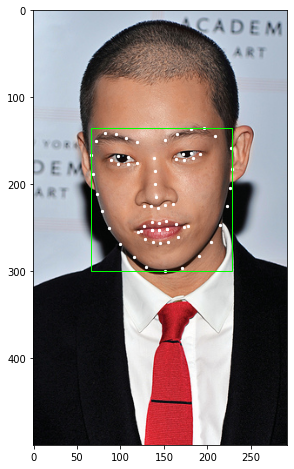

In [238]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,8))
ax.imshow(img1)

rect = patches.Rectangle((left, top), width, height, linewidth=1, edgecolor="lime", facecolor="none")
ax.add_patch(rect)

#ax[1].imshow(img2)
ax.scatter(ptc1[:,0], ptc1[:,1], c="w", s=5)
#ax[1].scatter(ptc2[:,0], ptc2[:,1], c="w", s=5)

#ax[2].set_xlim(100, 300)
#ax[2].set_ylim(120, 400)
#ax[2].invert_yaxis()

#ax[2].scatter(ptc1[:,0], ptc1[:,1], c="r", s=5)
#ax[2].scatter(ptc2[:,0], ptc2[:,1], c="b", s=5)

plt.show()

### Wasserstein distance

In [35]:
M = np.linalg.norm(ptc1[:, None, :] - ptc2[None, :, :], ord=2, axis=-1) ** 2
n = ptc1.shape[0]
a, b = np.ones((n,)) / n, np.ones((n,)) / n
#M = ot.dist(ptc1, ptc2)
#M /= M.max()
M

array([[ 4360.67775929,  2623.14760396,  1310.64040285, ...,
         2239.0701702 ,  1558.71383621,  1129.78329471],
       [ 8255.13490872,  5773.23161209,  3725.52034886, ...,
         2684.41185205,  2013.93538258,  1639.24726833],
       [13418.5138421 , 10195.47653372,  7397.58265626, ...,
         4082.83745851,  3470.12414971,  3184.85147283],
       ...,
       [42443.80307927, 37136.25807902, 31799.29357357, ...,
        14708.73408117, 15389.85449383, 16191.95281714],
       [40407.45305817, 35123.93042951, 29871.56462302, ...,
        13891.60517077, 14411.91521211, 15093.68818971],
       [38200.85343641, 32973.58201979, 27837.04918892, ...,
        13042.68549659, 13403.3329234 , 13963.59607314]])

In [680]:
N = LS.shape[0]
N

811

In [681]:
from sklearn.neighbors import NearestNeighbors

In [682]:
%%time
D = np.zeros((N, N))

for i in range(N):
    for j in range(i+1, N):
        M_ij = ot.dist(LS[i] / max_dim * 10, LS[j] / max_dim * 10)
        D[i,j] = ot.emd2(a, a, M_ij)
        
D = np.sqrt(D + D.T)
D

CPU times: user 3min 34s, sys: 3.25 s, total: 3min 37s
Wall time: 3min 57s


array([[0.        , 0.38098851, 0.50142742, ..., 1.64559577, 1.46672244,
        0.7569951 ],
       [0.38098851, 0.        , 0.62837007, ..., 1.45612947, 1.3316436 ,
        0.62573941],
       [0.50142742, 0.62837007, 0.        , ..., 1.99031818, 1.73846198,
        0.93775096],
       ...,
       [1.64559577, 1.45612947, 1.99031818, ..., 0.        , 1.14548646,
        1.32115411],
       [1.46672244, 1.3316436 , 1.73846198, ..., 1.14548646, 0.        ,
        1.14555337],
       [0.7569951 , 0.62573941, 0.93775096, ..., 1.32115411, 1.14555337,
        0.        ]])

In [643]:
nbrs = NearestNeighbors(n_neighbors=10, metric="precomputed").fit(D)
distances, indices = nbrs.kneighbors(D)

In [644]:
distances

array([[0.        , 0.38098851, 0.42454537, ..., 0.51139673, 0.52053232,
        0.52352346],
       [0.        , 0.27351111, 0.33720505, ..., 0.46277128, 0.46284837,
        0.46562914],
       [0.        , 0.26603648, 0.36132194, ..., 0.47019001, 0.49059481,
        0.49975983],
       ...,
       [0.        , 0.41690551, 0.46901969, ..., 0.5418239 , 0.55291785,
        0.57047089],
       [0.        , 0.52323287, 0.54064411, ..., 0.6858122 , 0.70216802,
        0.7031898 ],
       [0.        , 0.37205234, 0.39244675, ..., 0.52193899, 0.53321614,
        0.53361294]])

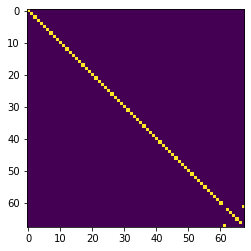

In [611]:
plt.imshow(A)

### Barycenter

In [455]:
X_init = np.random.uniform(size=(68, 2))

In [462]:
weights = np.array([0.1] * 10)
weights

array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

In [539]:
k = 35
B = ot.lp.free_support_barycenter([LS[k], LS[k+1], LS[k+2], LS[k+3], LS[k+4], LS[k+5], LS[k+6], LS[k+7], LS[k+8], LS[k+9]], [a] * 10, X_init, a, weights=weights, verbose=True)


iteration %d, displacement_square_norm=%f
 0 35795642.268902555
iteration %d, displacement_square_norm=%f
 1 41523.597187214786
iteration %d, displacement_square_norm=%f
 2 9474.439737574183
iteration %d, displacement_square_norm=%f
 3 11535.653610751722
iteration %d, displacement_square_norm=%f
 4 3333.8422386307734
iteration %d, displacement_square_norm=%f
 5 1128.2587307354024
iteration %d, displacement_square_norm=%f
 6 0.0


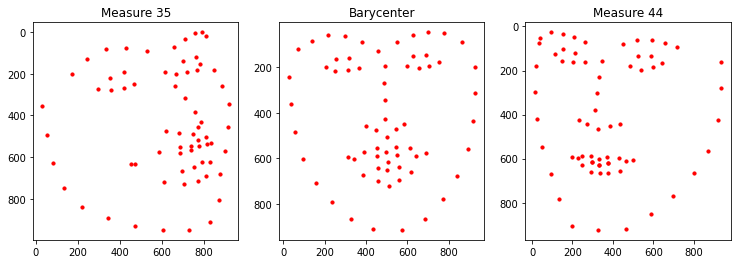

In [540]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12.5,4))
ax[0].invert_yaxis()
ax[0].set_title("Measure {}".format(k))
ax[0].scatter(LS[k,:,0], LS[k,:,1], c="r", s=10)
ax[1].invert_yaxis()
ax[1].set_title("Barycenter".format(i+1))
ax[1].scatter(B[:,0], B[:,1], c="r", s=10)
ax[2].invert_yaxis()
ax[2].set_title("Measure {}".format(k+9))
ax[2].scatter(LS[k+9,:,0], LS[k+9,:,1], c="r", s=10)
plt.show()

In [687]:
i, j = 0, 16
weights_7525 = np.array([0.75, 0.25])
weights_5050 = np.array([0.50, 0.50])
weights_2575 = np.array([0.25, 0.75])

In [688]:
B_7525 = ot.lp.free_support_barycenter([LS[i], LS[j]], [a] * 2, X_init, a, weights=weights_7525)
B_5050 = ot.lp.free_support_barycenter([LS[i], LS[j]], [a] * 2, X_init, a, weights=weights_5050)
B_2575 = ot.lp.free_support_barycenter([LS[i], LS[j]], [a] * 2, X_init, a, weights=weights_2575)

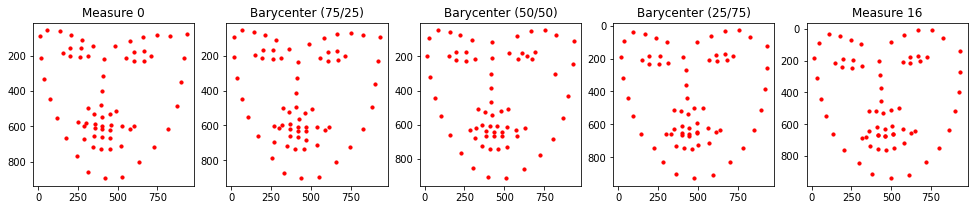

In [689]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(16.75,3))
ax[0].invert_yaxis()
ax[0].set_title("Measure {}".format(i))
ax[0].scatter(LS[i,:,0], LS[i,:,1], c="r", s=10)
ax[1].invert_yaxis()
ax[1].set_title("Barycenter (75/25)".format(i+1))
ax[1].scatter(B_7525[:,0], B_7525[:,1], c="r", s=10)
ax[2].invert_yaxis()
ax[2].set_title("Barycenter (50/50)".format(i+1))
ax[2].scatter(B_5050[:,0], B_5050[:,1], c="r", s=10)
ax[3].invert_yaxis()
ax[3].set_title("Barycenter (25/75)".format(i+1))
ax[3].scatter(B_2575[:,0], B_2575[:,1], c="r", s=10)
ax[4].invert_yaxis()
ax[4].set_title("Measure {}".format(j))
ax[4].scatter(LS[j,:,0], LS[j,:,1], c="r", s=10)
plt.show()

### Nearest neighbors barycenters

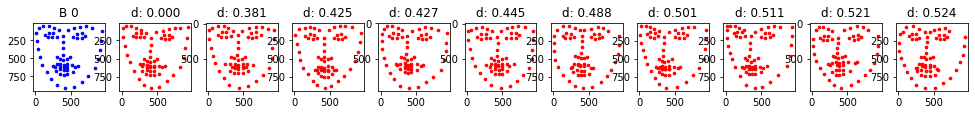

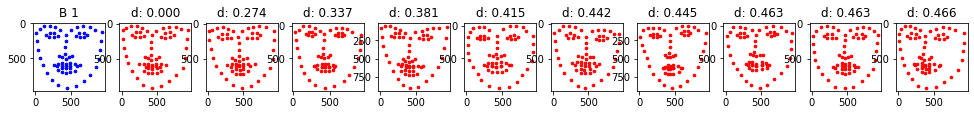

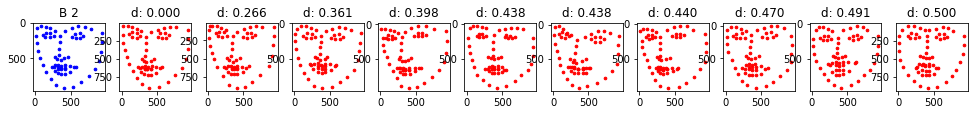

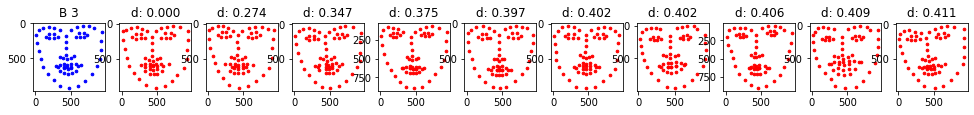

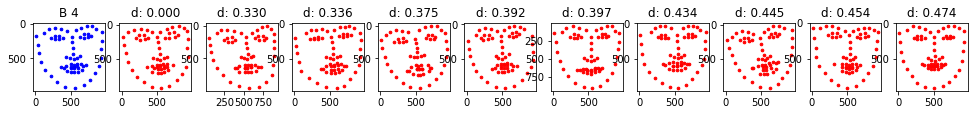

...

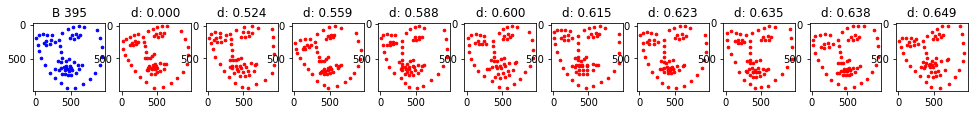

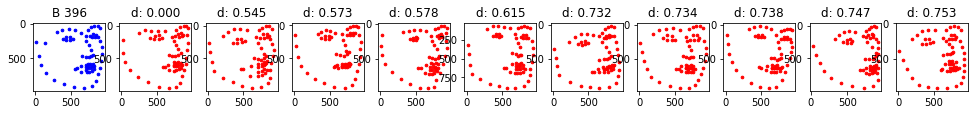

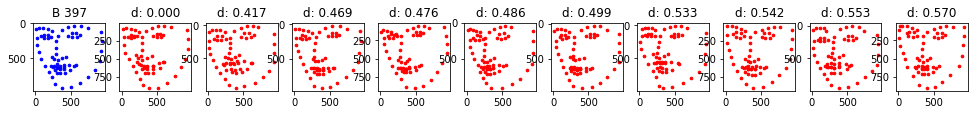

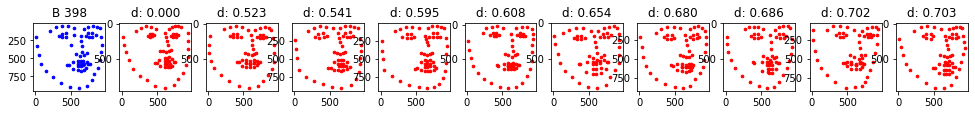

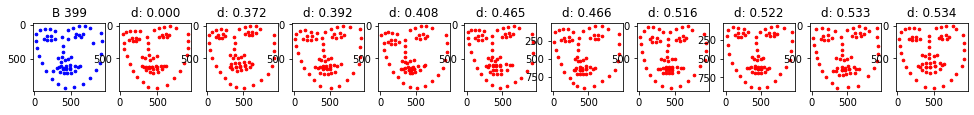

In [645]:
for ii, idx in enumerate(indices):
    B = ot.lp.free_support_barycenter([LS[idx[0]], LS[idx[1]], LS[idx[2]], LS[idx[3]], LS[idx[4]], LS[idx[5]], LS[idx[6]], LS[idx[7]], LS[idx[8]], LS[idx[9]]], [a] * 10, X_init, a)
    
    fig, ax = plt.subplots(nrows=1, ncols=11, figsize=(16.75,1.25))
    
    for k in range(10):
        ax[k+1].invert_yaxis()
        ax[k+1].set_title("d: {:.3f}".format(distances[ii][k]))
        ax[k+1].scatter(LS[idx[k]][:,0], LS[idx[k]][:,1], c="r", s=7)
    
    ax[0].invert_yaxis()
    ax[0].set_title("B {}".format(ii))
    ax[0].scatter(B[:,0], B[:,1], c="b", s=7)
    
    plt.show()

In [646]:
from sklearn.manifold import MDS

In [678]:
X_mds = MDS(n_components=20, metric=True, dissimilarity="precomputed", verbose=2, eps=0.0001).fit_transform(D)

it: 0, stress 58844.333909638
it: 1, stress 30462.641130297692
it: 2, stress 25888.991591807076
it: 3, stress 24837.254350226238
it: 4, stress 24287.355330402635
it: 5, stress 23678.087811100933
it: 6, stress 22815.63419281405
it: 7, stress 21559.804687206175
it: 8, stress 19803.58933799174
it: 9, stress 17526.409220917576
it: 10, stress 14858.777346984887
it: 11, stress 12077.8789058405
it: 12, stress 9495.178260880875
it: 13, stress 7320.356267487102
it: 14, stress 5614.485541457107
it: 15, stress 4333.821717445483
it: 16, stress 3393.554519893092
it: 17, stress 2708.3382670287665
it: 18, stress 2208.012657660221
it: 19, stress 1839.8741383795875
it: 20, stress 1565.9977757212946
it: 21, stress 1359.6064104177453
it: 22, stress 1201.90010576588
it: 23, stress 1079.6526109717122
it: 24, stress 983.4987422164172
it: 25, stress 906.748147914098
it: 26, stress 844.572878325332
it: 27, stress 793.4520159115912
it: 28, stress 750.7907008534114
it: 29, stress 714.6570467820472
it: 30, stres

it: 282, stress 33.616537462905235
it: 283, stress 33.48481621036548
it: 284, stress 33.354138465215684
it: 285, stress 33.22449348151284
it: 286, stress 33.0958706614621
it: 287, stress 32.968259552089634
it: 288, stress 32.84164984202847
it: 289, stress 32.71603135841228
it: 290, stress 32.59139406387312
it: 291, stress 32.4677280536384
it: 292, stress 32.34502355272376
it: 293, stress 32.22327091321721
it: 294, stress 32.10246061165164
it: 295, stress 31.982583246461544
it: 296, stress 31.86362953552116
it: 297, stress 31.745590313760278
it: 298, stress 31.62845653085528
it: 299, stress 31.51221924899184
it: 0, stress 59352.404911455196
it: 1, stress 30670.75384734746
it: 2, stress 25747.242945749837
it: 3, stress 24540.02209459426
it: 4, stress 23806.84328160439
it: 5, stress 22920.39133439719
it: 6, stress 21665.511327739176
it: 7, stress 19910.37712777372
it: 8, stress 17616.834478866935
it: 9, stress 14905.089111581074
it: 10, stress 12059.869730913422
it: 11, stress 9415.903598

it: 287, stress 34.27344538306373
it: 288, stress 34.13139400086602
it: 289, stress 33.99043170244643
it: 290, stress 33.85054975161023
it: 291, stress 33.71173947968437
it: 292, stress 33.57399228424242
it: 293, stress 33.43729962791165
it: 294, stress 33.301653037256244
it: 295, stress 33.167044101732294
it: 296, stress 33.033464472708914
it: 297, stress 32.90090586255183
it: 298, stress 32.769360043764294
it: 299, stress 32.63881884818179
it: 0, stress 58305.323695294566
it: 1, stress 30490.834179735764
it: 2, stress 25821.970055889058
it: 3, stress 24720.51841519004
it: 4, stress 24118.38915376566
it: 5, stress 23426.999032178108
it: 6, stress 22444.441779443147
it: 7, stress 21030.59147231155
it: 8, stress 19095.324190370688
it: 9, stress 16659.251078530477
it: 10, stress 13906.50240115118
it: 11, stress 11145.435420431444
it: 12, stress 8671.555548036613
it: 13, stress 6647.875608140357
it: 14, stress 5092.825048379929
it: 15, stress 3940.46904363045
it: 16, stress 3100.575905737

it: 263, stress 35.90611450651752
it: 264, stress 35.759981066632335
it: 265, stress 35.61496517523768
it: 266, stress 35.47105407892507
it: 267, stress 35.32823526480559
it: 268, stress 35.18649645431764
it: 269, stress 35.045825597217195
it: 270, stress 34.90621086574433
it: 271, stress 34.76764064895923
it: 272, stress 34.63010354724219
it: 273, stress 34.49358836695173
it: 274, stress 34.35808411523498
it: 275, stress 34.223579994985755
it: 276, stress 34.09006539994476
it: 277, stress 33.95752990993731
it: 278, stress 33.82596328624406
it: 279, stress 33.69535546710033
it: 280, stress 33.56569656331954
it: 281, stress 33.4369768540372
it: 282, stress 33.30918678257119
it: 283, stress 33.18231695239479
it: 284, stress 33.05635812321905
it: 285, stress 32.931301207180745
it: 286, stress 32.807137265133065
it: 287, stress 32.683857503035654
it: 288, stress 32.56145326844107
it: 289, stress 32.43991604707475
it: 290, stress 32.31923745950587
it: 291, stress 32.199409257906254
it: 292,

it: 265, stress 35.934010125064795
it: 266, stress 35.788663582995625
it: 267, stress 35.64445669042326
it: 268, stress 35.50137692841771
it: 269, stress 35.35941199712653
it: 270, stress 35.218549809657425
it: 271, stress 35.07877848618972
it: 272, stress 34.94008634830474
it: 273, stress 34.80246191352591
it: 274, stress 34.66589389005985
it: 275, stress 34.530371171729605
it: 276, stress 34.395882833092394
it: 277, stress 34.26241812473339
it: 278, stress 34.12996646872866
it: 279, stress 33.99851745426986
it: 280, stress 33.86806083344372
it: 281, stress 33.73858651716
it: 282, stress 33.610084571221584
it: 283, stress 33.48254521253067
it: 284, stress 33.35595880542537
it: 285, stress 33.230315858141246
it: 286, stress 33.10560701939267
it: 287, stress 32.98182307506881
it: 288, stress 32.85895494503963
it: 289, stress 32.736993680067314
it: 290, stress 32.61593045881887
it: 291, stress 32.49575658497555
it: 292, stress 32.37646348443518
it: 293, stress 32.258042702603994
it: 294,

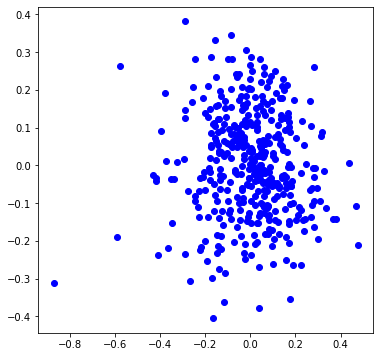

In [686]:
plt.figure(figsize=(6,6))
plt.scatter(X_mds[:,0], X_mds[:,1], c="b")
plt.show()